Libraries to intstall to use GEE in colab

In [ ]:
!pip install ipyleaflet==0.17
!pip install eemont
!pip install rasterio
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.0 MB/s eta 0:00:00
  Attempting uninstall: ipyleaflet
    Found existing installation: ipyleaflet 0.18.2
    Uninstalling ipyleaflet-0.18.2:
      Successfully uninstalled ipyleaflet-0.18.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
geemap 0.32.1 requires ipyleaflet==0.18.2, but you have ipyleaflet 0.17.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.7/134.7 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eemont: filename=eemont-0.3.6-py3-none-any.whl size=135742 sha256=d096c5e741527deb9a53bef2acfc471aebe8402016f8feb69e6d34478ec21189
  

In [ ]:
import ee
import eemont
import geemap as geemap
import os
import math
import rasterio
from rasterio.windows import Window
import folium
import earthpy.plot as ep
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imageio
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # statistical data visualization
import tensorflow as tf
import keras
from keras import Sequential
from keras.layers import Dense, Dropout, Input
from keras.callbacks import EarlyStopping
from keras import Model

import sklearn.model_selection
from keras.utils import to_categorical, plot_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier



GEE authentication

In [ ]:
ee.Authenticate()
ee.Initialize(project='ee-andreagonnelli06')
# Define the URL format used for Earth Engine generated map tiles.
EE_TILES = 'https://earthengine.googleapis.com/map/{mapid}/{{z}}/{{x}}/{{y}}?token={token}'

print('Folium version: ' + folium.__version__)


Project area GEOjson conversion in feature collection to clip the image collections or the images used to estimate the AGB.

In [ ]:
geojson = {"type":"FeatureCollection","features":[{"type":"Feature","properties":{},"geometry":{"coordinates":[[12.78632055620858,42.18169545297127],[12.786010513010382,42.1814090541948],[12.785883097998038,42.18145626287344],[12.785475369956941,42.181843372711114],[12.785556066131477,42.18189687550978],[12.785161079591404,42.18210459183089],[12.785233281432284,42.18214235836135],[12.786010513010382,42.18176469204164],[12.786307814706504,42.18174895589581],[12.786329050542236,42.18169545297127]],"type":"LineString"}}]}
area = ee.FeatureCollection(geojson)


In [ ]:
Map = geemap.Map(toolbar_ctrl=True, layer_ctrl=True)
Map

Map(center=[0, 0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(childr…

In [ ]:
rectangle=Map.draw_last_feature
rectangle.getInfo()
geometria=rectangle.geometry().getInfo()

coordinates=geometria['coordinates'][0]
coordinates1=coordinates[0]
coordinates2=coordinates[2]


In [ ]:
rectangles = ee.Geometry.Rectangle([coordinates1, coordinates2])
def clippa(image):
  return image.clip(rectangles)

Sentinel-1 download and filtering

In [ ]:
S1_PRS = ee.ImageCollection('COPERNICUS/S1_GRD')\
    .filterDate('2021-04-01', '2021-06-30')\
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))\
    .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH'))\
    .filter(ee.Filter.eq('instrumentMode', 'IW'))\
    .filter(ee.Filter.eq('orbitProperties_pass', 'ASCENDING'))\
    .filterBounds(rectangles)\
    .map(clippa);

Sentinel-1 preprocessing and visualization

In [ ]:
S1_PRS_pc = S1_PRS.reduce(ee.Reducer.percentile([25,50,75]));
S1_PRS_pc = ee.Image(10).pow(S1_PRS_pc.divide(10));

S1_PRS_pc_Feats = S1_PRS_pc.select(['VH_p50','VV_p50']).clip(rectangles);
S1_PRS_pc_Feats = S1_PRS_pc_Feats.reproject(crs= 'EPSG:4326',scale= 30);

PRS_VV_iqr = S1_PRS_pc_Feats.addBands((S1_PRS_pc.select('VV_p75').subtract(S1_PRS_pc.select('VV_p25'))).rename('VV_iqr'));
PRS_VH_iqr = S1_PRS_pc_Feats.addBands((S1_PRS_pc.select('VH_p75').subtract(S1_PRS_pc.select('VH_p25'))).rename('VH_iqr'));
PRS_VV_iqr  = PRS_VV_iqr.float();
PRS_VH_iqr  = PRS_VH_iqr.float();

display('Post-rainy Season VV IQR', PRS_VV_iqr);

display('Post-rainy Season VV IQR', PRS_VH_iqr);

visvv = {'min': 0,'max': 0.1,'bands': 'VV_iqr'}
visvh = {'min': 0,'max': 0.1,'bands': 'VH_iqr'}

Map.addLayer(PRS_VV_iqr,visvv, 'Sentinel-1 IW VV');
Map.addLayer( PRS_VH_iqr,visvh, 'Sentinel-1 IW VH');

Map.centerObject(S1_PRS, 8)
Map


'Post-rainy Season VV IQR'

'Post-rainy Season VV IQR'

Map(bottom=3121.03515625, center=[46.11450926334854, 12.19523283409605], controls=(WidgetControl(options=['pos…

Sentinel-2 cloudMasking and reflectance normalization.

In [ ]:
s2 = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED');

def  maskS2clouds(image):
  qa = image.select('QA60');

  cloudBitMask = ee.Number(2).pow(10).int();
  cirrusBitMask = ee.Number(2).pow(11).int();

  mask = qa.bitwiseAnd(cloudBitMask).eq(0)&(qa.bitwiseAnd(cirrusBitMask).eq(0))

  return image.updateMask(mask).divide(10000);

def calculate_indices(image):
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    evi = image.expression(
        '2.5 * ((NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1))',
        {
            'NIR': image.select('B8'),
            'RED': image.select('B4'),
            'BLUE': image.select('B2')
        }).rename('EVI')
    ndii = image.normalizedDifference(['B3', 'B8']).rename('NDII')
    return image.addBands([ndvi, evi, ndii])

composite = s2.filterDate('2021-04-01', '2021-06-30')\
                  .filterBounds(rectangles)\
                  .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))\
                  .map(maskS2clouds)\
                  .map(calculate_indices)\
                  .map(clippa)\


S2_composite = composite.median().reproject(crs= 'EPSG:4326', scale= 30);
S2_composite = S2_composite.float()
S2_composite = S2_composite.select('B4','B5','B8','B11', 'B12','NDVI','EVI','NDII')
display(S2_composite)
vis_s2 = {'min': 0, 'max': 0.3, 'bands': ['B11', 'B8', 'B4']};

Map.addLayer(S2_composite, vis_s2, 'Sentinel-2');
Map.centerObject(S1_PRS, 8)
Map

Map(bottom=3121.03515625, center=[46.11450926334854, 12.19523283409605], controls=(WidgetControl(options=['pos…

Set of the canopy Height Model

In [ ]:
canopy_ht = ee.ImageCollection("projects/meta-forest-monitoring-okw37/assets/CanopyHeight")\
.filterBounds(rectangles)\
.map(clippa)\
.select('cover_code')\
.first()\
.float()

canopy_ht=canopy_ht.reproject(crs= 'EPSG:4326', scale= 30)
Map.addLayer(canopy_ht, {'min': 0, 'max': 10, 'palette': ['blue', 'yellow', 'orange', 'red']}, 'Canopy Height');
Map.centerObject(S1_PRS, 8)
Map

Map(bottom=3121.03515625, center=[46.11450926334854, 12.19523283409605], controls=(WidgetControl(options=['pos…

Set of the slope and elevation data

In [ ]:
SRTM = ee.Image("USGS/SRTMGL1_003");

elevation = SRTM.clip(rectangles);

elevation = elevation.reproject(crs='EPSG:4326',scale=30).float();
display(elevation)
slope = ee.Terrain.slope(SRTM).clip(rectangles);
display(slope)
slope = slope.reproject(crs='EPSG:4326',scale=30).float();

Map.addLayer(elevation, {'min': 0, 'max': 4000, 'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5']}, 'SRTM');
Map.addLayer(slope, {'min': 0, 'max': 90, 'palette': ['blue', 'yellow', 'orange', 'red']}, 'Slope');
Map.centerObject(S1_PRS, 8)
Map

Name,Description
elevation,Elevation


Map(bottom=23585.0, center=[46.11450926334854, 12.19523283409605], controls=(WidgetControl(options=['position'…

Merging of the satellite data and bands definition

In [ ]:
bands = ['B4','B5','B8','B11', 'B12','NDVI','EVI','NDII', 'VV_iqr', 'VH_iqr', 'elevation', 'slope','cover_code','agbd'];


Preprocessing of GEDI data


In [ ]:
l4b = ee.ImageCollection('LARSE/GEDI/GEDI04_A_002_MONTHLY')\
.filterDate('2021-04-01', '2021-06-30')\
.filterBounds(rectangles)\
.median();

not_null = l4b.select('agbd').unmask()
aboveground = l4b.select('agbd')
maschera= aboveground.gt(0).mask()

# Applica il filtro all'immagine
dataset = aboveground.updateMask(maschera)
dataset=dataset.clip(rectangles).float();
display(dataset)

dataset1 = dataset.reproject(crs= 'EPSG:4326', scale=30);

Map.addLayer(dataset1,
    {'min': 10, 'max': 250, 'palette':['440154','414387','2a788e','23a884','7ad151','fde725']},
    'Mean Biomass');
Map.centerObject(S1_PRS, 8)
Map

Map(bottom=23585.0, center=[46.11450926334854, 12.19523283409605], controls=(WidgetControl(options=['position'…

In [ ]:
mergedCollection = S2_composite.addBands(PRS_VV_iqr.addBands(PRS_VH_iqr.addBands(elevation.addBands(slope))).addBands(canopy_ht).addBands(dataset1));

mergedCollection

import time
for i in range(rectangles.size().getInfo()):
    # Ottieni la feature corrente
    feature = ee.Feature(rectangles.toList(rectangles.size()).get(i))
    
    # Campiona i dati spettrali per la feature corrente
    points=dataset1.sample(region=feature.geometry(),
    scale=30,
    numPixels=400000,
    geometries=True)

    display(points)

    ssample = mergedCollection.addBands(dataset1).sampleRegions(collection=points,
    properties=['agbd'],
    scale=30,
    geometries=True)
    display(ssample)
    
    # Esporta il campione in CSV
    nome_file = f'dati_campionati_{i}'
    task = ee.batch.Export.table.toDrive(
        collection=ssample,
        description=nome_file,
        folder='GEE_export',
        fileFormat='CSV'
    )
    task.start()
    
    # Attendi il completamento del task
    while task.active():
        print('Task in corso...')
        time.sleep(5)

print("Esportazione completata.")

Conversion of the GEDI pixels in feature Collection to use as training and test datasets.

In [ ]:

ee.batch.Export.image.toDrive(
  image=mergedCollection.select(bands),
  description='mergedCollection4',
  scale=30,
  region=rectangles,
  maxPixels=1e13
).start()



In [ ]:
points=dataset1.sample(region=rectangles,
   scale=30,
   numPixels=500000,
   geometries=True)

display(points)

In [ ]:
datawithColumn = points.randomColumn('random', 27);
split = 0.7;
trainingData = datawithColumn.filter(ee.Filter.lt('random', split));
display('training data', trainingData);
validationData = datawithColumn.filter(ee.Filter.gte('random', split));
display('validation data', validationData);

'training data'

'validation data'

Sampling of the training and test dataset on the mergedcollection

In [ ]:
sample = mergedCollection.sampleRegions(collection=trainingData,
  properties=['agbd'],
  geometries=True)
display(sample)

vsample = mergedCollection.sampleRegions(collection=validationData,
  properties=['agbd'],
  geometries=True)
display(vsample)

RF architecture

In [ ]:
classifier = ee.Classifier.smileRandomForest(100)\
  .train(
    features=sample,
    classProperty="agbd",
    inputProperties=bands
    );
vclassifier = ee.Classifier.smileRandomForest(100)\
  .train(
    features=vsample,
    classProperty="agbd",
    inputProperties=bands
    );
regression = mergedCollection.classify(classifier, 'predicted');
regression

In [ ]:
classifier

In [ ]:
predictedTraining = regression.sampleRegions(collection=trainingData, geometries=True);
sampleTraining = predictedTraining.select(['agbd', 'predicted']);
sampleTraining

In [ ]:
plt.plot(sampleTraining.aggregate_array('agbd').getInfo(), sampleTraining.aggregate_array('predicted').getInfo(), 'bo')
plt.show()

Accuracy of the model

In [ ]:
label = 'agbd'
validation_accuracy = sampleTraining.errorMatrix(label, 'predicted')
#display('Validation error matrix', validation_accuracy)
display('Validation accuracy', validation_accuracy.accuracy())

'Validation accuracy'

In [ ]:
display('Results of trained classifier', classifier.explain())
# Get a confusion matrix and overall accuracy for the training sample.
train_accuracy = classifier.confusionMatrix()
#display('Training error matrix', train_accuracy)
display('Training overall accuracy', train_accuracy.accuracy())
label = 'agbd'
labell = ['agbd']

In [ ]:
# Get a confusion matrix and overall accuracy for the validation sample.

validation_accuracy = vclassifier.confusionMatrix()
#display('Validation error matrix', validation_accuracy)
display('Validation accuracy', validation_accuracy.accuracy())

'Validation accuracy'

AGB image prediction

In [ ]:
# Classify the reflectance image from the trained classifier.
img_classified = mergedCollection.classify(classifier)
vis_params = {'bands': ['classification'], 'palette': ['#440154', ' #440256', ' #450457', ' #450559', ' #46075a', ' #46085c', ' #460a5d', ' #460b5e', ' #470d60', ' #470e61', ' #471063', ' #471164', ' #471365', ' #481467', ' #481668', ' #481769', ' #48186a', ' #481a6c', ' #481b6d', ' #481c6e', ' #481d6f', ' #481f70', ' #482071', ' #482173', ' #482374', ' #482475', ' #482576', ' #482677', ' #482878', ' #482979', ' #472a7a', ' #472c7a', ' #472d7b', ' #472e7c', ' #472f7d', ' #46307e', ' #46327e', ' #46337f', ' #463480', ' #453581', ' #453781', ' #453882', ' #443983', ' #443a83', ' #443b84', ' #433d84', ' #433e85', ' #423f85', ' #424086', ' #424186', ' #414287', ' #414487', ' #404588', ' #404688', ' #3f4788', ' #3f4889', ' #3e4989', ' #3e4a89', ' #3e4c8a', ' #3d4d8a', ' #3d4e8a', ' #3c4f8a', ' #3c508b', ' #3b518b', ' #3b528b', ' #3a538b', ' #3a548c', ' #39558c', ' #39568c', ' #38588c', ' #38598c', ' #375a8c', ' #375b8d', ' #365c8d', ' #365d8d', ' #355e8d', ' #355f8d', ' #34608d', ' #34618d', ' #33628d', ' #33638d', ' #32648e', ' #32658e', ' #31668e', ' #31678e', ' #31688e', ' #30698e', ' #306a8e', ' #2f6b8e', ' #2f6c8e', ' #2e6d8e', ' #2e6e8e', ' #2e6f8e', ' #2d708e', ' #2d718e', ' #2c718e', ' #2c728e', ' #2c738e', ' #2b748e', ' #2b758e', ' #2a768e', ' #2a778e', ' #2a788e', ' #29798e', ' #297a8e', ' #297b8e', ' #287c8e', ' #287d8e', ' #277e8e', ' #277f8e', ' #27808e', ' #26818e', ' #26828e', ' #26828e', ' #25838e', ' #25848e', ' #25858e', ' #24868e', ' #24878e', ' #23888e', ' #23898e', ' #238a8d', ' #228b8d', ' #228c8d', ' #228d8d', ' #218e8d', ' #218f8d', ' #21908d', ' #21918c', ' #20928c', ' #20928c', ' #20938c', ' #1f948c', ' #1f958b', ' #1f968b', ' #1f978b', ' #1f988b', ' #1f998a', ' #1f9a8a', ' #1e9b8a', ' #1e9c89', ' #1e9d89', ' #1f9e89', ' #1f9f88', ' #1fa088', ' #1fa188', ' #1fa187', ' #1fa287', ' #20a386', ' #20a486', ' #21a585', ' #21a685', ' #22a785', ' #22a884', ' #23a983', ' #24aa83', ' #25ab82', ' #25ac82', ' #26ad81', ' #27ad81', ' #28ae80', ' #29af7f', ' #2ab07f', ' #2cb17e', ' #2db27d', ' #2eb37c', ' #2fb47c', ' #31b57b', ' #32b67a', ' #34b679', ' #35b779', ' #37b878', ' #38b977', ' #3aba76', ' #3bbb75', ' #3dbc74', ' #3fbc73', ' #40bd72', ' #42be71', ' #44bf70', ' #46c06f', ' #48c16e', ' #4ac16d', ' #4cc26c', ' #4ec36b', ' #50c46a', ' #52c569', ' #54c568', ' #56c667', ' #58c765', ' #5ac864', ' #5cc863', ' #5ec962', ' #60ca60', ' #63cb5f', ' #65cb5e', ' #67cc5c', ' #69cd5b', ' #6ccd5a', ' #6ece58', ' #70cf57', ' #73d056', ' #75d054', ' #77d153', ' #7ad151', ' #7cd250', ' #7fd34e', ' #81d34d', ' #84d44b', ' #86d549', ' #89d548', ' #8bd646', ' #8ed645', ' #90d743', ' #93d741', ' #95d840', ' #98d83e', ' #9bd93c', ' #9dd93b', ' #a0da39', ' #a2da37', ' #a5db36', ' #a8db34', ' #aadc32', ' #addc30', ' #b0dd2f', ' #b2dd2d', ' #b5de2b', ' #b8de29', ' #bade28', ' #bddf26', ' #c0df25', ' #c2df23', ' #c5e021', ' #c8e020', ' #cae11f', ' #cde11d', ' #d0e11c', ' #d2e21b', ' #d5e21a', ' #d8e219', ' #dae319', ' #dde318', ' #dfe318', ' #e2e418', ' #e5e419', ' #e7e419', ' #eae51a', ' #ece51b', ' #efe51c', ' #f1e51d', ' #f4e61e', ' #f6e620', ' #f8e621', ' #fbe723', ' #fde725'], 'min': 2.0, 'max': 167.0, 'opacity': 1.0}
Map.addLayer(img_classified, vis_params, 'Classified')
Map


Map(bottom=24590.0, center=[42.155913139993004, 12.984823020480082], controls=(WidgetControl(options=['positio…

In [ ]:

Map.addLayer(area)
Map
#somma dell'above ground biomass calcolata per il numero di pixel contenuti nell'area di progetto


Map(bottom=24866639.77734375, center=[42.181581278489766, 12.786653072107587], controls=(WidgetControl(options…

In [ ]:
area_p=Map.draw_last_feature
area_p.getInfo()
progetto=area_p.geometry().getInfo()

posizioni=progetto['coordinates'][0]
posizioni1=posizioni[0]
posizioni2=posizioni[2]
area_di_progetto = ee.Geometry.Rectangle([posizioni1, posizioni2])
agb_project = img_classified.clip(area_di_progetto)
Map.addLayer(agb_project, vis_params, 'agb_project')
Map


Map(bottom=24866640.0, center=[42.181581278489766, 12.786653072107587], controls=(WidgetControl(options=['posi…

Application of allometric eqaution to estimate the CO2 stock

In [ ]:
pixel_counts = agb_project.reduceRegion(reducer=ee.Reducer.sum(), geometry=area, scale=30).getNumber('classification')
pixel_counts

In [ ]:
belowgroundbiomass = pixel_counts*(0.2)
belowgroundbiomass
biomass = pixel_counts+belowgroundbiomass
biomass
carbon = biomass*(0.475)
carbon
Co2 = carbon*(3.67)

In [ ]:
belowgroundbiomass

In [ ]:
biomass

In [ ]:
carbon

In [ ]:
Co2

In [ ]:
import os
import rasterio
import numpy as np


# Definisci il percorso del file TIFF
file_path = "/content/drive/MyDrive/mergedCollection.tif"

with rasterio.open(file_path) as src:
    # Lettura dei dati di ciascuna banda
    for band_num in range(1, src.count + 1):
        # Lettura dei dati della banda specifica
        band_data = src.read(band_num)
        # Creazione del nome del file per la banda
        band_file_name = f"banda_{band_num}.npy"
        # Salvataggio dell'array della banda come file NumPy
        np.save(band_file_name, band_data)
# Definisci il percorso del file TIFF
file_path = "/content/drive/MyDrive/mergedCollection2.tif"

with rasterio.open(file_path) as src:
    # Lettura dei dati di ciascuna banda
    for band_num in range(1, src.count + 1):
        # Lettura dei dati della banda specifica
        band_data = src.read(band_num)
        # Creazione del nome del file per la banda
        band_file_name = f"2banda_{band_num}.npy"
        # Salvataggio dell'array della banda come file NumPy
        np.save(band_file_name, band_data)

# Definisci il percorso del file TIFF
file_path = "/content/drive/MyDrive/mergedCollection3.tif"

with rasterio.open(file_path) as src:
    # Lettura dei dati di ciascuna banda
    for band_num in range(1, src.count + 1):
        # Lettura dei dati della banda specifica
        band_data = src.read(band_num)
        # Creazione del nome del file per la banda
        band_file_name = f"3banda_{band_num}.npy"
        # Salvataggio dell'array della banda come file NumPy
        np.save(band_file_name, band_data)

file_path = "/content/drive/MyDrive/mergedCollection4.tif"

with rasterio.open(file_path) as src:
    # Lettura dei dati di ciascuna banda
    for band_num in range(1, src.count + 1):
        # Lettura dei dati della banda specifica
        band_data = src.read(band_num)
        # Creazione del nome del file per la banda
        band_file_name = f"4banda_{band_num}.npy"
        # Salvataggio dell'array della banda come file NumPy
        np.save(band_file_name, band_data)

In [ ]:
# Definisci i nomi dei file NumPy
file_names = ["banda_1.npy", "banda_2.npy", "banda_3.npy","banda_4.npy","banda_5.npy","banda_6.npy","banda_7.npy",
              "banda_8.npy", "banda_9.npy", "banda_10.npy","banda_11.npy","banda_12.npy","banda_13.npy",
              "banda_14.npy"]  # Aggiungi tutti i nomi dei file NumPy

# Lista per salvare gli array NumPy delle bande
band_arrays = []

# Itera attraverso i nomi dei file
for file_name in file_names:
    # Carica l'array NumPy utilizzando np.load()
    band_data = np.load("/content/" + file_name)  # Assicurati di specificare il percorso corretto
    # Aggiungi l'array alla lista delle bande
    band_arrays.append(band_data)

# Definisci i nomi dei file NumPy
SECfile_names = ["2banda_1.npy", "2banda_2.npy", "2banda_3.npy","2banda_4.npy","2banda_5.npy","2banda_6.npy","2banda_7.npy",
              "2banda_8.npy", "2banda_9.npy", "2banda_10.npy","2banda_11.npy","2banda_12.npy","2banda_13.npy",
              "2banda_14.npy"]  # Aggiungi tutti i nomi dei file NumPy

# Lista per salvare gli array NumPy delle bande
secband_arrays = []

# Itera attraverso i nomi dei file
for file_name in SECfile_names:
    # Carica l'array NumPy utilizzando np.load()
    band_data = np.load("/content/" + file_name)  # Assicurati di specificare il percorso corretto
    # Aggiungi l'array alla lista delle bande
    secband_arrays.append(band_data)

# Definisci i nomi dei file NumPy
terfile_names = ["3banda_1.npy", "3banda_2.npy", "3banda_3.npy","3banda_4.npy","3banda_5.npy","3banda_6.npy","3banda_7.npy",
              "3banda_8.npy", "3banda_9.npy", "3banda_10.npy","3banda_11.npy","3banda_12.npy","3banda_13.npy",
              "3banda_14.npy"]  # Aggiungi tutti i nomi dei file NumPy

# Lista per salvare gli array NumPy delle bande
terband_arrays = []

# Itera attraverso i nomi dei file
for file_name in terfile_names:
    # Carica l'array NumPy utilizzando np.load()
    band_data = np.load("/content/" + file_name)  # Assicurati di specificare il percorso corretto
    # Aggiungi l'array alla lista delle bande
    terband_arrays.append(band_data)

    # Definisci i nomi dei file NumPy
forfile_names = ["4banda_1.npy", "4banda_2.npy", "4banda_3.npy","4banda_4.npy","4banda_5.npy","4banda_6.npy","4banda_7.npy",
              "4banda_8.npy", "4banda_9.npy", "4banda_10.npy","4banda_11.npy","4banda_12.npy","4banda_13.npy",
              "4banda_14.npy"]  # Aggiungi tutti i nomi dei file NumPy

# Lista per salvare gli array NumPy delle bande
forband_arrays = []

# Itera attraverso i nomi dei file
for file_name in forfile_names:
    # Carica l'array NumPy utilizzando np.load()
    band_data = np.load("/content/" + file_name)  # Assicurati di specificare il percorso corretto
    # Aggiungi l'array alla lista delle bande
    forband_arrays.append(band_data)

In [ ]:
features = {
  'B04' : band_arrays[0].flatten(),
  'B05' : band_arrays[1].flatten(),
  'B08' : band_arrays[2].flatten(),
  'B11' : band_arrays[3].flatten(),
  'B12' : band_arrays[4].flatten(),
  'NDVI' : band_arrays[5].flatten(),
  'EVI' : band_arrays[6].flatten(),
  'NDII' : band_arrays[7].flatten(),
  'PRS_VV' : band_arrays[8].flatten(),
  'PRS_VH': band_arrays[9].flatten(),
  'elevation': band_arrays[10].flatten(),
  'slope' : band_arrays[11].flatten(),
  'canopy' : band_arrays[12].flatten(),
  'gedi':band_arrays[13].flatten()
}
secfeatures = {
  'B04' : secband_arrays[0].flatten(),
  'B05' : secband_arrays[1].flatten(),
  'B08' : secband_arrays[2].flatten(),
  'B11' : secband_arrays[3].flatten(),
  'B12' : secband_arrays[4].flatten(),
  'NDVI' : secband_arrays[5].flatten(),
  'EVI' : secband_arrays[6].flatten(),
  'NDII' : secband_arrays[7].flatten(),
  'PRS_VV' : secband_arrays[8].flatten(),
  'PRS_VH': secband_arrays[9].flatten(),
  'elevation': secband_arrays[10].flatten(),
  'slope' : secband_arrays[11].flatten(),
  'canopy' : secband_arrays[12].flatten(),
  'gedi':secband_arrays[13].flatten()
}
terfeatures = {
  'B04' : terband_arrays[0].flatten(),
  'B05' : terband_arrays[1].flatten(),
  'B08' : terband_arrays[2].flatten(),
  'B11' : terband_arrays[3].flatten(),
  'B12' : terband_arrays[4].flatten(),
  'NDVI' : terband_arrays[5].flatten(),
  'EVI' : terband_arrays[6].flatten(),
  'NDII' : terband_arrays[7].flatten(),
  'PRS_VV' : terband_arrays[8].flatten(),
  'PRS_VH': terband_arrays[9].flatten(),
  'elevation': terband_arrays[10].flatten(),
  'slope' : terband_arrays[11].flatten(),
  'canopy' : terband_arrays[12].flatten(),
  'gedi':terband_arrays[13].flatten()
}

forfeatures = {
  'B04' : forband_arrays[0].flatten(),
  'B05' : forband_arrays[1].flatten(),
  'B08' : forband_arrays[2].flatten(),
  'B11' : forband_arrays[3].flatten(),
  'B12' : forband_arrays[4].flatten(),
  'NDVI' : forband_arrays[5].flatten(),
  'EVI' : forband_arrays[6].flatten(),
  'NDII' : forband_arrays[7].flatten(),
  'PRS_VV' : forband_arrays[8].flatten(),
  'PRS_VH': forband_arrays[9].flatten(),
  'elevation': forband_arrays[10].flatten(),
  'slope' : forband_arrays[11].flatten(),
  'canopy' : forband_arrays[12].flatten(),
  'gedi':forband_arrays[13].flatten()
}

In [ ]:
df = pd.DataFrame(features)
df= df.dropna()
df
df2 = pd.DataFrame(secfeatures)
df2= df2.dropna()
df3 = pd.DataFrame(terfeatures)
df3= df3.dropna()
df4 = pd.DataFrame(forfeatures)
df4= df4.dropna()

In [ ]:
from sklearn.preprocessing import MinMaxScaler,Normalizer,StandardScaler


In [ ]:
# Seleziona solo le colonne che desideri normalizzare
columns_to_normalize = [ 'elevation', 'slope']

# Crea un oggetto StandardScaler
scaler = MinMaxScaler()

# Normalizza le colonne selezionate
df_normalized = df.copy()  # Copia il dataframe originale per evitare modifiche indesiderate
df_normalized[columns_to_normalize] = scaler.fit_transform(df_normalized[columns_to_normalize])

secdf_normalized = df2.copy()  # Copia il dataframe originale per evitare modifiche indesiderate
secdf_normalized[columns_to_normalize] = scaler.fit_transform(secdf_normalized[columns_to_normalize])
terdf_normalized = df3.copy()  # Copia il dataframe originale per evitare modifiche indesiderate
terdf_normalized[columns_to_normalize] = scaler.fit_transform(terdf_normalized[columns_to_normalize])
fordf_normalized = df4.copy()  # Copia il dataframe originale per evitare modifiche indesiderate
fordf_normalized[columns_to_normalize] = scaler.fit_transform(fordf_normalized[columns_to_normalize])
# Visualizza il dataframe normalizzato
print(df_normalized['canopy'].head())

3463     0.0
3518    14.0
3569    10.0
3625     4.0
3673     8.0
Name: canopy, dtype: float32



Statistiche descrittive:
                B04           B05           B08           B11           B12  \
count  73481.000000  73481.000000  73481.000000  73481.000000  73481.000000   
mean       0.071070      0.134972      0.351064      0.228213      0.134525   
std        0.060167      0.052023      0.071996      0.052149      0.053129   
min        0.008750      0.006900      0.002100      0.004450      0.003850   
25%        0.036600      0.110000      0.303350      0.194600      0.097450   
50%        0.055450      0.125450      0.348200      0.220150      0.119900   
75%        0.085150      0.145800      0.396150      0.255100      0.158400   
max        0.931600      0.960100      0.825300      0.718500      0.641800   

               NDVI           EVI          NDII        PRS_VV        PRS_VH  \
count  73481.000000  73481.000000  73481.000000  73481.000000  73481.000000   
mean       0.664686      0.500511     -0.606739      0.116558      0.026147   
std        0.196842      

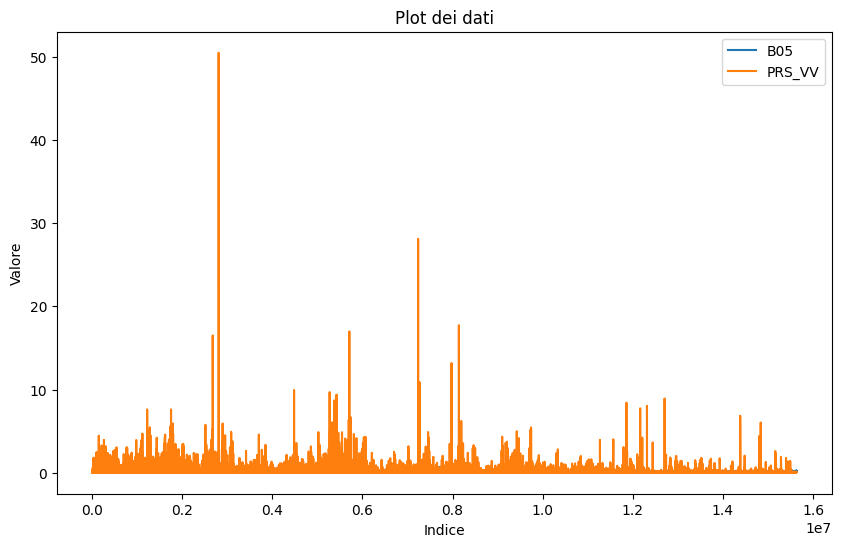

In [ ]:
descriptive_stats = df_normalized.describe()
print("\nStatistiche descrittive:")
print(descriptive_stats)

# Plotta i dati
plt.figure(figsize=(10, 6))
plt.plot(df_normalized['B05'], label='B05')
plt.plot(df_normalized['PRS_VV'], label='PRS_VV')
plt.xlabel('Indice')
plt.ylabel('Valore')
plt.title('Plot dei dati')
plt.legend()
plt.show()

In [ ]:
Q1 = df_normalized.quantile(0.05)
Q3 = df_normalized.quantile(0.95)
IQR = Q3 - Q1
outliers = ((df_normalized < (Q1 - 1.5 * IQR)) | (df_normalized > (Q3 + 1.5 * IQR))).any(axis=1)

# Rimuovi gli outliers
df_no_outliers = df_normalized[~outliers]
# Identifica gli outliers
secoutliers = ((secdf_normalized < (Q1 - 1.5 * IQR)) | (secdf_normalized > (Q3 + 1.5 * IQR))).any(axis=1)
teroutliers = ((terdf_normalized < (Q1 - 1.5 * IQR)) | (terdf_normalized > (Q3 + 1.5 * IQR))).any(axis=1)
terdf_no_outliers = terdf_normalized[~teroutliers]
# Rimuovi gli outliers
secdf_no_outliers = secdf_normalized[~secoutliers]
foroutliers = ((fordf_normalized < (Q1 - 1.5 * IQR)) | (fordf_normalized > (Q3 + 1.5 * IQR))).any(axis=1)
fordf_no_outliers = fordf_normalized[~foroutliers]

In [ ]:
totdf_no_outliers = pd.concat([df_no_outliers, secdf_no_outliers,terdf_no_outliers,fordf_no_outliers], axis=0)
df_y = totdf_no_outliers['gedi']
df_x = totdf_no_outliers.drop(['gedi'], axis=1)
df_x.shape
df_y.shape

(423581,)

In [ ]:
split_pnt = int(df_x.shape[0] * 0.70) # consider 2/3 as the split point. 66.66 % for training set, and 0.33 % for test set.

xx_train = df_x.iloc[:split_pnt,:]
yy_train = df_y.iloc[:split_pnt]

xx_test = df_x.iloc[split_pnt:,:]
yy_test = df_y.iloc[split_pnt:]
xx_train.shape, xx_test.shape, yy_train.shape, yy_test.shape

((296506, 13), (127075, 13), (296506,), (127075,))

In [ ]:
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import joblib
from joblib import parallel_backend
from scipy.stats import randint

In [ ]:
modello = RandomForestRegressor(n_estimators=250, max_depth=20, min_samples_split=10, random_state=42,verbose=6)
modello.fit(xx_train, yy_train)
#150,20,15

building tree 1 of 250
building tree 2 of 250
building tree 3 of 250
building tree 4 of 250
building tree 5 of 250
building tree 6 of 250
building tree 7 of 250
building tree 8 of 250
building tree 9 of 250
building tree 10 of 250
building tree 11 of 250
building tree 12 of 250


[Parallel(n_jobs=1)]: Done  12 tasks      | elapsed:  1.0min


building tree 13 of 250
building tree 14 of 250
building tree 15 of 250
building tree 16 of 250
building tree 17 of 250
building tree 18 of 250
building tree 19 of 250
building tree 20 of 250
building tree 21 of 250
building tree 22 of 250
building tree 23 of 250
building tree 24 of 250
building tree 25 of 250
building tree 26 of 250
building tree 27 of 250
building tree 28 of 250
building tree 29 of 250
building tree 30 of 250
building tree 31 of 250
building tree 32 of 250
building tree 33 of 250
building tree 34 of 250
building tree 35 of 250
building tree 36 of 250
building tree 37 of 250
building tree 38 of 250
building tree 39 of 250
building tree 40 of 250
building tree 41 of 250
building tree 42 of 250
building tree 43 of 250
building tree 44 of 250
building tree 45 of 250
building tree 46 of 250
building tree 47 of 250
building tree 48 of 250
building tree 49 of 250


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:  4.3min


building tree 50 of 250
building tree 51 of 250
building tree 52 of 250
building tree 53 of 250
building tree 54 of 250
building tree 55 of 250
building tree 56 of 250
building tree 57 of 250
building tree 58 of 250
building tree 59 of 250
building tree 60 of 250
building tree 61 of 250
building tree 62 of 250
building tree 63 of 250
building tree 64 of 250
building tree 65 of 250
building tree 66 of 250
building tree 67 of 250
building tree 68 of 250
building tree 69 of 250
building tree 70 of 250
building tree 71 of 250
building tree 72 of 250
building tree 73 of 250
building tree 74 of 250
building tree 75 of 250
building tree 76 of 250
building tree 77 of 250
building tree 78 of 250
building tree 79 of 250
building tree 80 of 250
building tree 81 of 250
building tree 82 of 250
building tree 83 of 250
building tree 84 of 250
building tree 85 of 250
building tree 86 of 250
building tree 87 of 250
building tree 88 of 250
building tree 89 of 250
building tree 90 of 250
building tree 91

[Parallel(n_jobs=1)]: Done 112 tasks      | elapsed:  9.6min


building tree 113 of 250
building tree 114 of 250
building tree 115 of 250
building tree 116 of 250
building tree 117 of 250
building tree 118 of 250
building tree 119 of 250
building tree 120 of 250
building tree 121 of 250
building tree 122 of 250
building tree 123 of 250
building tree 124 of 250
building tree 125 of 250
building tree 126 of 250
building tree 127 of 250
building tree 128 of 250
building tree 129 of 250
building tree 130 of 250
building tree 131 of 250
building tree 132 of 250
building tree 133 of 250
building tree 134 of 250
building tree 135 of 250
building tree 136 of 250
building tree 137 of 250
building tree 138 of 250
building tree 139 of 250
building tree 140 of 250
building tree 141 of 250
building tree 142 of 250
building tree 143 of 250
building tree 144 of 250
building tree 145 of 250
building tree 146 of 250
building tree 147 of 250
building tree 148 of 250
building tree 149 of 250
building tree 150 of 250
building tree 151 of 250
building tree 152 of 250


[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed: 16.9min


building tree 200 of 250
building tree 201 of 250
building tree 202 of 250
building tree 203 of 250
building tree 204 of 250
building tree 205 of 250
building tree 206 of 250
building tree 207 of 250
building tree 208 of 250
building tree 209 of 250
building tree 210 of 250
building tree 211 of 250
building tree 212 of 250
building tree 213 of 250
building tree 214 of 250
building tree 215 of 250
building tree 216 of 250
building tree 217 of 250
building tree 218 of 250
building tree 219 of 250
building tree 220 of 250
building tree 221 of 250
building tree 222 of 250
building tree 223 of 250
building tree 224 of 250
building tree 225 of 250
building tree 226 of 250
building tree 227 of 250
building tree 228 of 250
building tree 229 of 250
building tree 230 of 250
building tree 231 of 250
building tree 232 of 250
building tree 233 of 250
building tree 234 of 250
building tree 235 of 250
building tree 236 of 250
building tree 237 of 250
building tree 238 of 250
building tree 239 of 250


RandomForestRegressor(max_depth=20, min_samples_split=10, n_estimators=250,
                      random_state=42, verbose=6)

[Parallel(n_jobs=1)]: Done  12 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done 112 tasks      | elapsed:    7.1s


Train Mean Squared Error: 1154.6493
Train R² Score: 0.7362
Root Mean Squared Error: 33.98013093657938
Mean Absolute Error: 21.51541344417567


[Parallel(n_jobs=1)]: Done  12 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done 112 tasks      | elapsed:    3.4s


Test Mean Squared Error: 5266.2737
Test R² Score: 0.4025
Root Mean Squared Error: 72.5690962632898
Mean Absolute Error: 46.25336627042403
      Feature  Importance
12     canopy    0.461409
11      slope    0.139063
10  elevation    0.062255
0         B04    0.040026
9      PRS_VH    0.040015
6         EVI    0.038122
1         B05    0.037905
8      PRS_VV    0.037027
4         B12    0.030495
7        NDII    0.029913
3         B11    0.029203
5        NDVI    0.027339
2         B08    0.027228


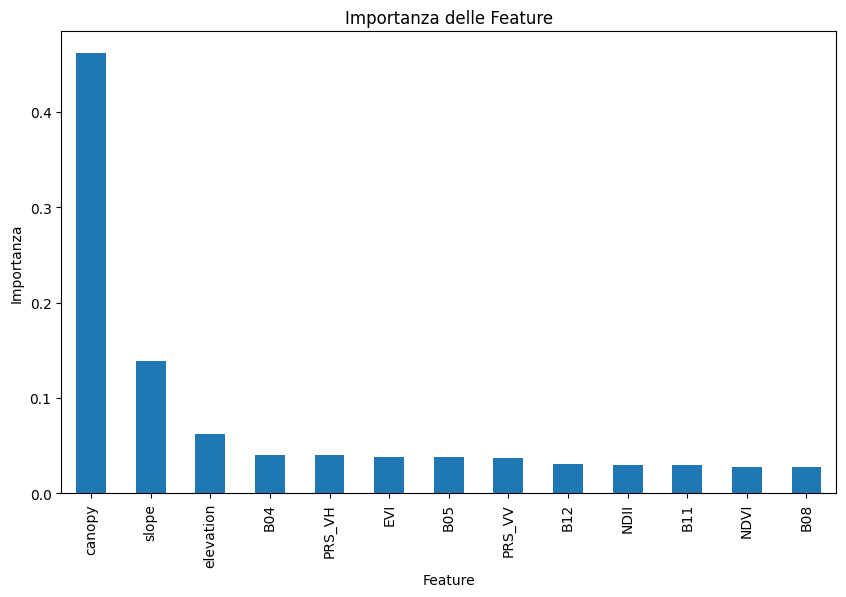

In [ ]:
from sklearn import metrics
y_train_pred = modello.predict(xx_train)

# Calcolare le metriche di valutazione
train_mse = mean_squared_error(yy_train, y_train_pred)
train_r2 = r2_score(yy_train, y_train_pred)

print(f'Train Mean Squared Error: {train_mse:.4f}')
print(f'Train R² Score: {train_r2:.4f}')
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(yy_train, y_train_pred)))
print('Mean Absolute Error:', metrics.mean_absolute_error(yy_train, y_train_pred))

y_test_pred = modello.predict(xx_test)

# Calcolare le metriche di valutazione
test_mse = mean_squared_error(yy_test, y_test_pred)
test_r2 = r2_score(yy_test, y_test_pred)

print(f'Test Mean Squared Error: {test_mse:.4f}')
print(f'Test R² Score: {test_r2:.4f}')
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(yy_test, y_test_pred)))
print('Mean Absolute Error:', metrics.mean_absolute_error(yy_test, y_test_pred))
# Estrarre l'importanza delle caratteristiche
feature_importances = modello.feature_importances_

# Creare un dataframe per visualizzare l'importanza delle feature
features = xx_train.columns
importances = pd.DataFrame({'Feature': features, 'Importance': feature_importances})

# Ordinare per importanza
importances = importances.sort_values(by='Importance', ascending=False)

# Visualizzare
print(importances)

# Tracciare l'importanza delle feature
importances.plot(kind='bar', x='Feature', y='Importance', legend=False, figsize=(10, 6))
plt.title('Importanza delle Feature')
plt.ylabel('Importanza')
plt.show()

In [ ]:
file_path = "/content/drive/MyDrive/mergedCollection.tif"

In [ ]:
image_input = []
for x in range(14):
  image_input.append(image.read(x + 1))
image_input = np.stack(image_input).reshape(14, -1).T

# Predict
prediction = model.predict(image_input, batch_size=4096*20) * 450
prediction = prediction.reshape(shape[0], shape[1])

# Visualize
ep.plot_bands(prediction, cmap='YlGn', figsize=plot_size)